<a href="https://colab.research.google.com/github/psjpang/CS-Notes/blob/master/1_f_voss_music.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Get thinkdsp.py : 
# read and write of waveforms need to use thinkdsp.py code written by others （in python）

import os

if not os.path.exists('thinkdsp.py'):
    !wget https://github.com/AllenDowney/ThinkDSP/raw/master/code/thinkdsp.py

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

from thinkdsp import decorate

In [ ]:
def voss(nrows, ncols =18):
  #set the values for the first row and first column to be random, 
  # and then set the rest of the array to Nan
  
  array = np.full((nrows, ncols), np.nan)
  array[0, :] = np.random.random(ncols)
  array[:, 0] = np.random.random(nrows)
 
  # The next step is to select the location where the random source changes
  p = 0.5
  n=nrows
  cols = np.random.geometric(0.5,n)
  #
  cols[cols >= ncols] = 0
  rows = np.random.randint(nrows, size=n)
  array[rows, cols] = np.random.random(n)

  import pandas as pd
  df = pd.DataFrame(array)
  df.fillna(method='ffill', axis=0, inplace=True)
  total = df.sum(axis=1)

  return total.values

In [ ]:
ys = voss(10000)
ys

array([ 9.64168809,  9.46646062,  9.18975979, ..., 11.4209384 ,
       11.31025638, 11.19207514])

In [ ]:
from thinkdsp import Wave
wave = Wave(ys)
wave.unbias()
wave.normalize()

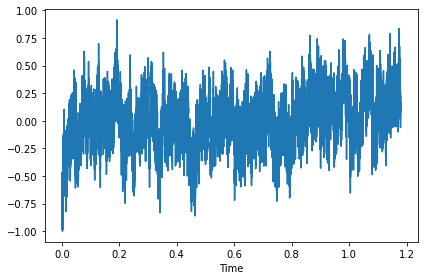

In [ ]:
wave.plot()
decorate(xlabel='Time')

In [ ]:
wave.make_audio()

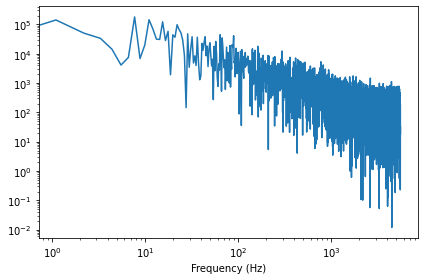

In [ ]:
spectrum = wave.make_spectrum()
spectrum.hs[0] = 0
spectrum.plot_power()
decorate(xlabel='Frequency (Hz)',
         xscale='log', 
         yscale='log')

In [ ]:
spectrum.estimate_slope().slope

-0.9803885295480036

In [ ]:
seg_length = 64 * 1024
iters = 100
wave = Wave(voss(seg_length * iters))
len(wave)

6553600

In [ ]:
from thinkdsp import Spectrum

def bartlett_method(wave, seg_length=512, win_flag=True):
    """Estimates the power spectrum of a noise wave.
    
    wave: Wave
    seg_length: segment length
    """
    # make a spectrogram and extract the spectrums
    spectro = wave.make_spectrogram(seg_length, win_flag)
    spectrums = spectro.spec_map.values()
    
    # extract the power array from each spectrum
    psds = [spectrum.power for spectrum in spectrums]
    
    # compute the root mean power (which is like an amplitude)
    hs = np.sqrt(sum(psds) / len(psds))
    fs = next(iter(spectrums)).fs
    
    # make a Spectrum with the mean amplitudes
    spectrum = Spectrum(hs, fs, wave.framerate)
    return spectrum

In [ ]:
spectrum = bartlett_method(wave, seg_length=seg_length, win_flag=False)
spectrum.hs[0] = 0
len(spectrum)

32769

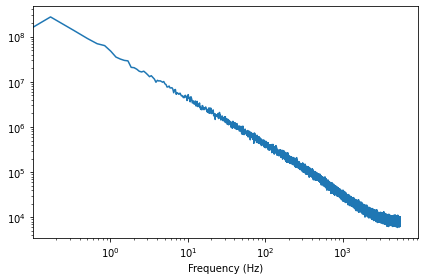

In [ ]:
spectrum.plot_power()
decorate(xlabel='Frequency (Hz)',
                 xscale='log', 
                 yscale='log')

In [ ]:
spectrum.estimate_slope().slope

-1.0010186416320104